In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import re
import nltk
from nltk.corpus import stopwords

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
!unrar x "/content/gdrive/My Drive/data/wiki.simple.rar" "/content/gdrive/My Drive/data/"


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from /content/gdrive/My Drive/data/wiki.simple.rar


Would you like to replace the existing file /content/gdrive/My Drive/data/wiki.simple.bin
2668450750 bytes, modified on 2017-10-19 16:43
with a new one
2668450750 bytes, modified on 2017-10-19 16:43

[Y]es, [N]o, [A]ll, n[E]ver, [R]ename, [Q]uit 
User break

User break


In [ ]:
data = pd.read_csv('/content/gdrive/My Drive/data/Amazon_Unlocked_Mobile.csv')

In [ ]:
data.shape

(413840, 6)

In [ ]:
data.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0


In [ ]:
data.tail()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes
413835,Samsung Convoy U640 Phone for Verizon Wireless...,Samsung,79.95,5,another great deal great price,0.0
413836,Samsung Convoy U640 Phone for Verizon Wireless...,Samsung,79.95,3,Ok,0.0
413837,Samsung Convoy U640 Phone for Verizon Wireless...,Samsung,79.95,5,Passes every drop test onto porcelain tile!,0.0
413838,Samsung Convoy U640 Phone for Verizon Wireless...,Samsung,79.95,3,I returned it because it did not meet my needs...,0.0
413839,Samsung Convoy U640 Phone for Verizon Wireless...,Samsung,79.95,4,Only downside is that apparently Verizon no lo...,0.0


In [ ]:
data.columns

Index(['Product Name', 'Brand Name', 'Price', 'Rating', 'Reviews',
       'Review Votes'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413840 entries, 0 to 413839
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Product Name  413840 non-null  object 
 1   Brand Name    348669 non-null  object 
 2   Price         407907 non-null  float64
 3   Rating        413840 non-null  int64  
 4   Reviews       413778 non-null  object 
 5   Review Votes  401544 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 18.9+ MB


In [ ]:
Reviews = data['Reviews']
len(Reviews)

413840

### Reviews Distribution by Price Category

Lets divide the data set into two classes: phones above 250 and below 250.

In [ ]:
min(data['Price'])

1.73

In [ ]:
Expensive=data[data['Price']>250]
N_Expensive=data[data['Price']<250]

In [ ]:
len(Expensive)

110661

In [ ]:
len(N_Expensive)

296663

In [ ]:
#percent
(len(Expensive)/float(len(Expensive)+len(N_Expensive)))*100


#~27.16% phones are above 250$

27.167807445669784

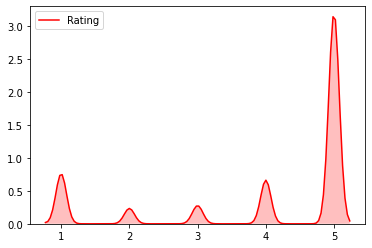

In [ ]:
sns.kdeplot(Expensive['Rating'],shade=True,color="red")

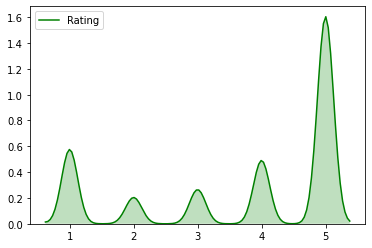

In [ ]:
sns.kdeplot(N_Expensive['Rating'],shade=True,color="green")

Overall , It could be infered that pricing has some effect on the ratings of phones.

# Reviews Analysis

Length of Reviews

In [ ]:
d=data['Reviews'].str.len().value_counts()

In [ ]:
max(d)

16317

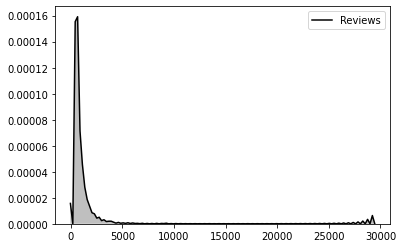

In [ ]:
sns.kdeplot(data['Reviews'].str.len(),shade=True,color="black")

#### Relationship between Price and Ratings

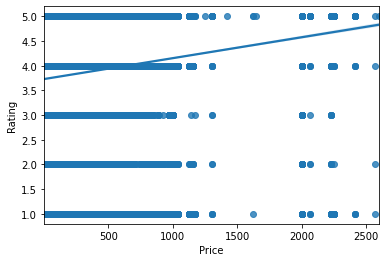

In [ ]:
sns.regplot(x='Price',y='Rating',data=data)

The trend noticed that the rating of phone is higher with the price.

# Categorical features

In [ ]:
categorical_features = (data.select_dtypes(include=['object']).columns.values)
categorical_features

array(['Product Name', 'Brand Name', 'Reviews'], dtype=object)

# Numerical Features

In [ ]:
numerical_features = data.select_dtypes(include = ['float64', 'int64']).columns.values
numerical_features

array(['Price', 'Rating', 'Review Votes'], dtype=object)

# Analysis By Brand

In [ ]:
Top_B=data['Brand Name'].value_counts().head(n=5).index.tolist()
print(data['Brand Name'].value_counts().head(n=10))

Samsung       65747
BLU           63248
Apple         58186
LG            22417
BlackBerry    16872
Nokia         16806
Motorola      13417
HTC           12724
CNPGD         12613
OtterBox       7989
Name: Brand Name, dtype: int64


### Make a new DataFrame for Top 10 Brands

In [ ]:
topten_Df=pd.DataFrame()

Phones_B=[]

for i in data['Brand Name'].value_counts().head(n=10).index.tolist():
    
    Phones_B.append(i)
    
for j in Phones_B:
  
    topten_Df=topten_Df.append(data[data['Brand Name']==j])

In [ ]:
topten_Df.shape

(290019, 6)

In [ ]:
topten_Df.head(10)

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0
5,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,1,I already had a phone with problems... I know ...,1.0
6,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,2,The charging port was loose. I got that solder...,0.0
7,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,2,"Phone looks good but wouldn't stay charged, ha...",0.0
8,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I originally was using the Samsung S2 Galaxy f...,0.0
9,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,3,It's battery life is great. It's very responsi...,0.0


# Ploting for Top 10 Brands

### Top 10 Brands Ratings

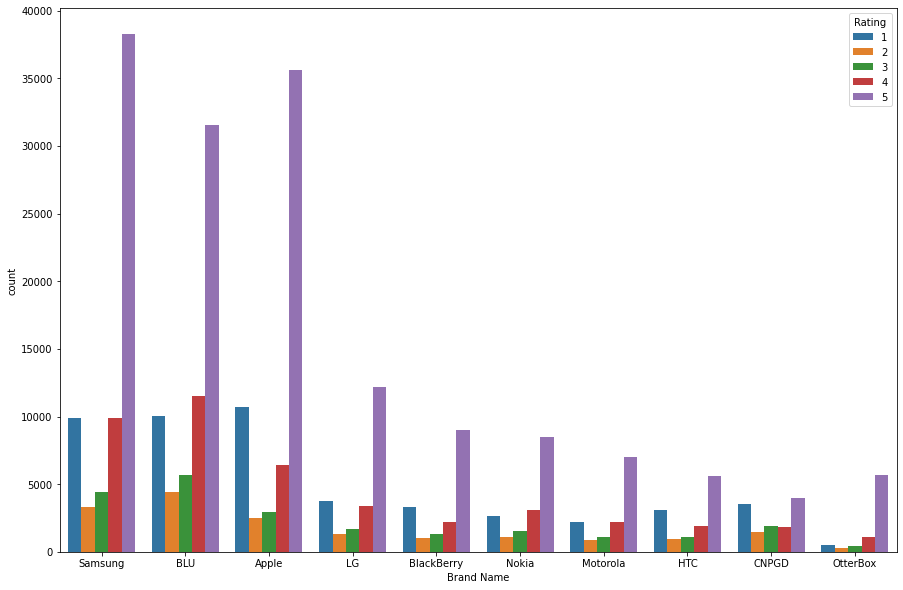

In [ ]:
fig,ax=plt.subplots(figsize=(15,10))
ax = sns.countplot(x="Brand Name", hue="Rating", data=topten_Df)

In [ ]:
import plotly.express as px
fig = px.histogram(topten_Df, x="Brand Name", color="Rating")
fig.show()

### Top 10 Brands Pricing

### Brand name and Price Based on Sentiment

In [ ]:
#sns.catplot(x="Brand Name", y="Price", hue = "sentiment", kind = "bar", data=topten_Df)
#plt.xticks(rotation=50)

# Analysis with Top 10 Brands with its Sentiments

In [ ]:
top10_senti = topten_Df
top10_senti.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0


In [ ]:
gd = top10_senti['Rating'][9]
gd

3

In [ ]:
top10_senti=top10_senti[top10_senti['Rating']!=3]
top10_senti.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 267865 entries, 0 to 289165
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Product Name  267865 non-null  object 
 1   Brand Name    267865 non-null  object 
 2   Price         264802 non-null  float64
 3   Rating        267865 non-null  int64  
 4   Reviews       267827 non-null  object 
 5   Review Votes  260013 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 14.3+ MB


In [ ]:
top10_senti=top10_senti.reset_index(drop=True)
top10_senti.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267865 entries, 0 to 267864
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Product Name  267865 non-null  object 
 1   Brand Name    267865 non-null  object 
 2   Price         264802 non-null  float64
 3   Rating        267865 non-null  int64  
 4   Reviews       267827 non-null  object 
 5   Review Votes  260013 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 12.3+ MB


In [ ]:
top10_senti['sentiment']=np.where(top10_senti['Rating'] > 3, 1, 0)
top10_senti[['Reviews','Rating','sentiment']].head(10)

,Reviews,Rating,sentiment
0,I feel so LUCKY to have found this used (phone...,5,1
1,"nice phone, nice up grade from my pantach revu...",4,1
2,Very pleased,5,1
3,It works good but it goes slow sometimes but i...,4,1
4,Great phone to replace my lost phone. The only...,4,1
5,I already had a phone with problems... I know ...,1,0
6,The charging port was loose. I got that solder...,2,0
7,"Phone looks good but wouldn't stay charged, ha...",2,0
8,I originally was using the Samsung S2 Galaxy f...,5,1
9,This is a great product it came after two days...,5,1


In [ ]:
#d = topten_Df.groupby('Brand Name')['sentiment'].value_counts()
#d1 = pd.DataFrame(d)
#d1

In [ ]:
import plotly.express as px
fig = px.histogram(top10_senti, x="Brand Name", color="sentiment")
fig.show()

# Brand name, Review count based on Rating

In [ ]:
plot3 = topten_Df.groupby(['Brand Name'])['Reviews'].count().reset_index()
plot3

,Brand Name,Reviews
0,Apple,58179
1,BLU,63246
2,BlackBerry,16872
3,CNPGD,12613
4,HTC,12724
5,LG,22410
6,Motorola,13417
7,Nokia,16805
8,OtterBox,7987
9,Samsung,65728


In [ ]:
tot_rating=topten_Df.groupby(['Brand Name'])['Rating'].count().reset_index()
tot_rating['Rating']

0    58186
1    63248
2    16872
3    12613
4    12724
5    22417
6    13417
7    16806
8     7989
9    65747
Name: Rating, dtype: int64

In [ ]:
plot3['Rating'] = tot_rating['Rating']
plot3

,Brand Name,Reviews,Rating
0,Apple,58179,58186
1,BLU,63246,63248
2,BlackBerry,16872,16872
3,CNPGD,12613,12613
4,HTC,12724,12724
5,LG,22410,22417
6,Motorola,13417,13417
7,Nokia,16805,16806
8,OtterBox,7987,7989
9,Samsung,65728,65747


Text(0.5, 1.0, 'Review_count VS Brand Based on Ratings\n')

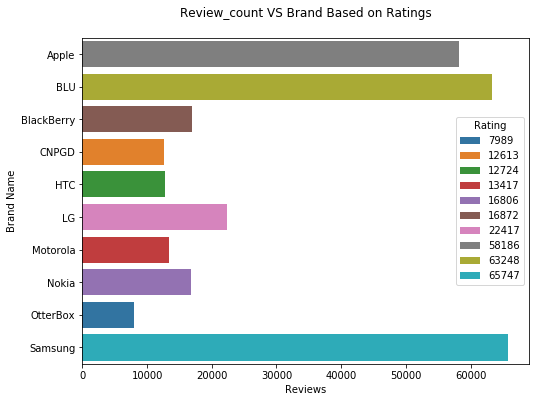

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(data=plot3,x="Reviews",y="Brand Name", hue="Rating",dodge=False)
plt.title('Review_count VS Brand Based on Ratings\n')

# Price vs Review Length

In [ ]:
tot = data['Reviews'].str.len()
pr = data["Price"]

No handles with labels found to put in legend.


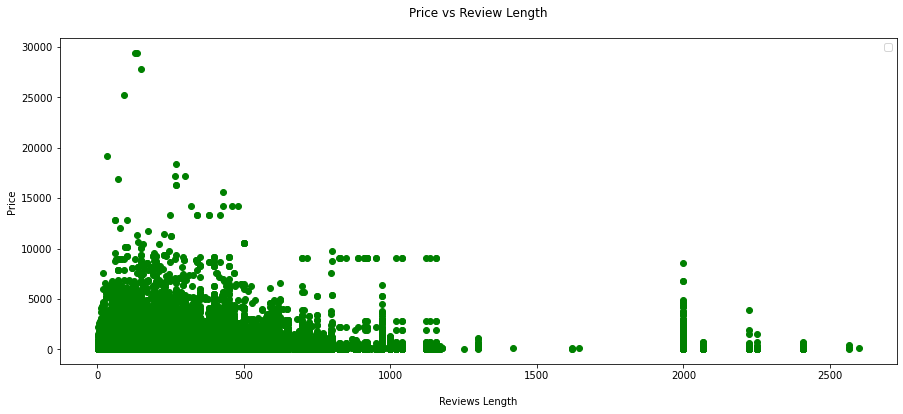

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15,6))
plt.scatter(pr,tot,color='green')
plt.xlabel('\nReviews Length')
plt.ylabel('Price')
plt.legend()
plt.title('Price vs Review Length\n')
plt.show()

# Cleaning data by removing rows having 'null' values.

In [ ]:
total = data.isnull().sum().sort_values(ascending=False)
missing_data = pd.concat([total], axis=1, keys=['Total'])
missing_data.head(20)

,Total
Brand Name,65171
Review Votes,12296
Price,5933
Reviews,62
Rating,0
Product Name,0


In [ ]:
#dropped rows having NaN values
data = data.dropna()

In [ ]:
total = data.isnull().sum().sort_values(ascending=False)
missing_data = pd.concat([total], axis=1, keys=['Total'])
missing_data.head(20)

,Total
Review Votes,0
Reviews,0
Rating,0
Price,0
Brand Name,0
Product Name,0


# CoRelation between price & rating

In [ ]:
data.corr()

,Price,Rating,Review Votes
Price,1.000000,0.073948,0.022164
Rating,0.073948,1.000000,-0.046526
Review Votes,0.022164,-0.046526,1.000000


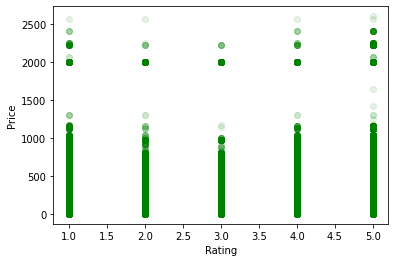

In [ ]:
import matplotlib.pyplot as plt
ylabel = data["Price"]
plt.ylabel("Price")
plt.xlabel("Rating")
xlabel = data["Rating"]
plt.scatter(xlabel, ylabel, alpha=0.1,color="green")
plt.show()

# CoRelation between Price and Review Votes

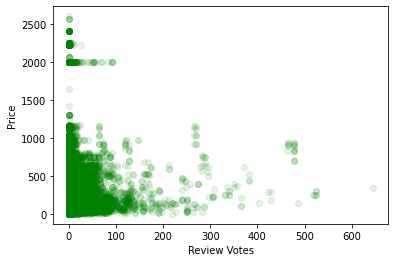

     Strong co-relation between review votes and price


In [ ]:
ylabel2 = data["Price"]
plt.ylabel("Price")
xlabel2 = data["Review Votes"]
plt.xlabel("Review Votes")
plt.scatter(xlabel2, ylabel2, alpha=0.1,color="green")
plt.show()
print("     Strong co-relation between review votes and price")

# Removing rows with rating=3 that is neutral sentiment

In [ ]:
s = data['Rating'][413838]
s

3

In [ ]:
data=data[data['Rating']!=3]
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 308277 entries, 0 to 413839
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Product Name  308277 non-null  object 
 1   Brand Name    308277 non-null  object 
 2   Price         308277 non-null  float64
 3   Rating        308277 non-null  int64  
 4   Reviews       308277 non-null  object 
 5   Review Votes  308277 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 16.5+ MB


In [ ]:
data=data.reset_index(drop=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308277 entries, 0 to 308276
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Product Name  308277 non-null  object 
 1   Brand Name    308277 non-null  object 
 2   Price         308277 non-null  float64
 3   Rating        308277 non-null  int64  
 4   Reviews       308277 non-null  object 
 5   Review Votes  308277 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 14.1+ MB


In [ ]:
data['sentiment']=np.where(data['Rating'] > 3, 1, 0)
data[['Reviews','Rating','sentiment']].head()

,Reviews,Rating,sentiment
0,I feel so LUCKY to have found this used (phone...,5,1
1,"nice phone, nice up grade from my pantach revu...",4,1
2,Very pleased,5,1
3,It works good but it goes slow sometimes but i...,4,1
4,Great phone to replace my lost phone. The only...,4,1


In [ ]:
data[['Reviews','Rating','sentiment']].tail()

,Reviews,Rating,sentiment
308272,good rugged phone that has a long-lasting batt...,4,1
308273,used hard,1,0
308274,another great deal great price,5,1
308275,Passes every drop test onto porcelain tile!,5,1
308276,Only downside is that apparently Verizon no lo...,4,1


# Data Cleaning and Text Preprocessing

In [ ]:
data.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,sentiment
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1


In [ ]:
new_data = data.iloc[:5761, :]

In [ ]:
new_data.shape

(5761, 7)

In [ ]:
new_data.columns

Index(['Product Name', 'Brand Name', 'Price', 'Rating', 'Reviews',
       'Review Votes', 'sentiment'],
      dtype='object')

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer

corpus=[]
def clean_d(review_column):
    for i in range(0,5761):
        review=review_column[i]             
        review = re.sub('[^a-zA-Z]', ' ',str(review)) 
        review=review.lower()
        review=review.split()
        WNlemma = nltk.WordNetLemmatizer()
        review=[WNlemma.lemmatize(t, pos='v') for t in review if not t in set(stopwords.words('english')) - set(['not'])]
        review=' '.join(review)
        corpus.append(review)
    return corpus

In [ ]:
%%time
review_column=new_data['Reviews']
review_corpus=clean_d(review_column)

CPU times: user 42.7 s, sys: 4.94 s, total: 47.6 s
Wall time: 47.7 s


In [ ]:
len(review_corpus)

5761

In [ ]:
len(new_data)

5761

In [ ]:
new_data['clean_review']=review_corpus
new_data.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,sentiment,clean_review
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,feel lucky find use phone us not use hard phon...
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,nice phone nice grade pantach revue clean set ...
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,please
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,work good go slow sometimes good phone love
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,great phone replace lose phone thing volume bu...


In [ ]:
new_data.head(20)

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,sentiment
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1
5,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,1,I already had a phone with problems... I know ...,1.0,0
6,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,2,The charging port was loose. I got that solder...,0.0,0
7,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,2,"Phone looks good but wouldn't stay charged, ha...",0.0,0
8,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I originally was using the Samsung S2 Galaxy f...,0.0,1
9,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,This is a great product it came after two days...,0.0,1


# Sentiment Analysis Using NLTK

### Intervals

In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

Demonstrate sentiment analysis via VADER(Valence Aware Dictionary for sentiment Reasoning).

ADER uses a combination of A sentiment lexicon is a list of lexical features (e.g., words) which are generally labeled according to their semantic orientation as either positive or negative. VADER not only tells about the Positivity and Negativity score but also tells us about how positive or negative a sentiment is.

For example words like 'joy', 'love' ,'like' convey positive sentiment.

But phrases like "did not like" also contain those words!. VADER is smart enough to recognize that and correctly detect these phrases as negative. Capitalization and Exclamation are also scored, like "LOVED!!!!"

In [ ]:
all_reviews = new_data['clean_review']
all_sent_values = []
all_sentiments = []

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
def sentiment_value(paragraph):
    analyser = SentimentIntensityAnalyzer()
    result = analyser.polarity_scores(paragraph)
    score = result['compound']
    return round(score,1)

/usr/local/lib/python3.6/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


In [ ]:
sample = new_data['clean_review'][1231]
print(sample)
print('Sentiment: ')
print(sentiment_value(sample))

phone awsome bright fast light awsome
Sentiment: 
0.4


In [ ]:
sample1 = new_data['clean_review'][13]
print(sample1)
print('Sentiment: ')
print(sentiment_value(sample1))

phone love not work get phone one thing sd card slot not open try access file managment even not show computer card fine able open another phone try trouble shoot
Sentiment: 
0.2


In [ ]:
sample2 = data['Reviews'][13]
print(sample2)
print('Sentiment: ')
print(sentiment_value(sample2))

Had this phone before and loved it but was not working so I got this phone. One thing is the SD card slot does not open up when I try to access it in file managment, even does not show up on the computer. The card is fine was able to open on another phone. Trying to trouble shoot it for now.
Sentiment: 
-0.5


In [ ]:
sample2 = new_data['clean_review'][0]
print(sample2)
print('Sentiment: ')
print(sentiment_value(sample2))

feel lucky find use phone us not use hard phone line someone upgrade sell one son like old one finally fell apart years want upgrade thank seller really appreciate honesty say use phone recommend seller highly would
Sentiment: 
0.9


In [ ]:
sample2 = new_data['clean_review'][0]
print(sample2)
print('Sentiment: ')
print(sentiment_value(sample2))

feel lucky find use phone us not use hard phone line someone upgrade sell one son like old one finally fell apart years want upgrade thank seller really appreciate honesty say use phone recommend seller highly would
Sentiment: 
0.9


##### Problem: Calling the function for full set of reviews ie: for 400,000+ , takes time.

In [ ]:
%%time
for i in range(0,5761):
    all_sent_values.append(sentiment_value(all_reviews[i])) # few  minutes around for calculation 

CPU times: user 42.7 s, sys: 46.2 ms, total: 42.8 s
Wall time: 42.8 s


In [ ]:
len(all_sent_values)

30000

In [ ]:
temp_data = new_data[0:5761]

In [ ]:
temp_data.shape

(5761, 8)

In [ ]:
SENTIMENT_VALUE = []
SENTIMENT = []
for i in range(0,5761):
    sent = all_sent_values[i]
    if (sent<=1 and sent>=0.5):
        SENTIMENT.append('V.Positive')
        SENTIMENT_VALUE.append(5)
    elif (sent<0.5 and sent>0):
        SENTIMENT.append('Positive')
        SENTIMENT_VALUE.append(4)
    elif (sent==0):
        SENTIMENT.append('Neutral')
        SENTIMENT_VALUE.append(3)
    elif (sent<0 and sent>=-0.5):
        SENTIMENT.append('Negative')
        SENTIMENT_VALUE.append(2)
    else:
        SENTIMENT.append('V.Negative')
        SENTIMENT_VALUE.append(1)

In [ ]:
temp_data['SENTIMENT_VALUE'] = SENTIMENT_VALUE
temp_data['SENTIMENT'] = SENTIMENT

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:

temp_data.head()

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,sentiment,clean_review,SENTIMENT_VALUE,SENTIMENT
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,feel lucky find use phone us not use hard phon...,5,V.Positive
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,nice phone nice grade pantach revue clean set ...,5,V.Positive
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,please,4,Positive
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,work good go slow sometimes good phone love,5,V.Positive
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,great phone replace lose phone thing volume bu...,4,Positive


##### Accuracy

In [ ]:
#find accuracy
counter = 0
for i in range(0,15761):
    if (abs(temp_data['Rating'][i]-temp_data['SENTIMENT_VALUE'][i])>1):
        counter += 1

KeyError: ignored

In [ ]:
counter

3571

639 occurences where Rating and Sentiment differ by more than 1.

In [ ]:
accuracy = (temp_data.shape[0]-counter)/temp_data.shape[0]
percent_accuracy = accuracy*100
percent_accuracy

77.3428081974494

In [ ]:
temp_data.to_csv('Amazon_new_data.csv')

# WordCloud

In [ ]:
from PIL import Image
from wordcloud import WordCloud

In [ ]:
def plot_wordcloud(text, mask=None, max_words=400, max_font_size=120, figure_size=(24.0,16.0), 
                   title = None, title_size=40, image_color=False):
    #stopwords = set(stopwords.words('english'))
    #more_stopwords = {'one', 'br', 'Po', 'th', 'sayi', 'fo', 'Unknown'}
    #stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='white',
                    #stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    mask = mask)
    wordcloud.generate(text)
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'green', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout()  
    
way = 'C:\\Users\\Dimpal\\Projects_File\\Mobile_Review_Prediction\\'

### WordCloud Positive feature selection

In [ ]:
positive_list = new_data['clean_review'][new_data.sentiment.isin(['1'])].unique().tolist()
positive_list_bow = " ".join(positive_list)

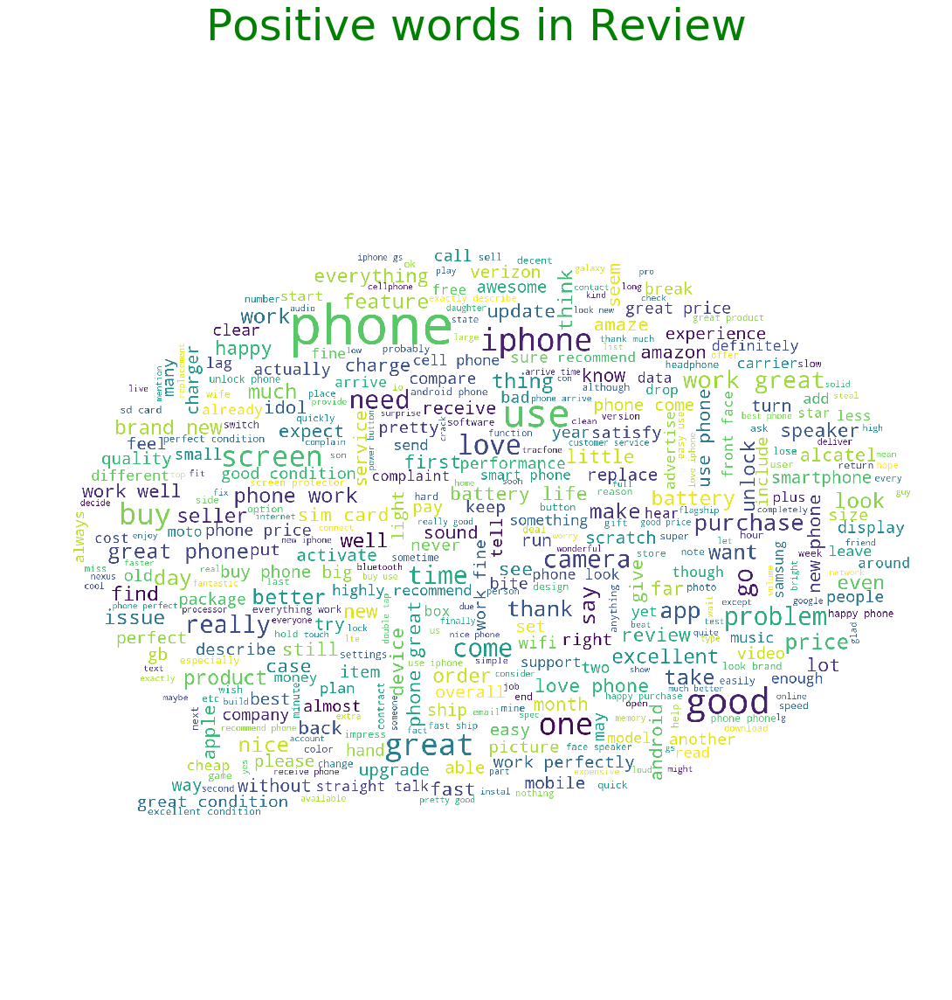

In [ ]:
comments_text = str(positive_list_bow)
comments_mask = np.array(Image.open(way + 'comment.png'))
plot_wordcloud(comments_text, comments_mask, max_words=400, max_font_size=120, 
               title = 'Positive words in Review', title_size=50)

### WordCloud Nagetive feature selection

In [ ]:
nagetive_list = new_data['clean_review'][new_data.sentiment.isin(['0'])].unique().tolist()
nagetive_list_bow = " ".join(nagetive_list)

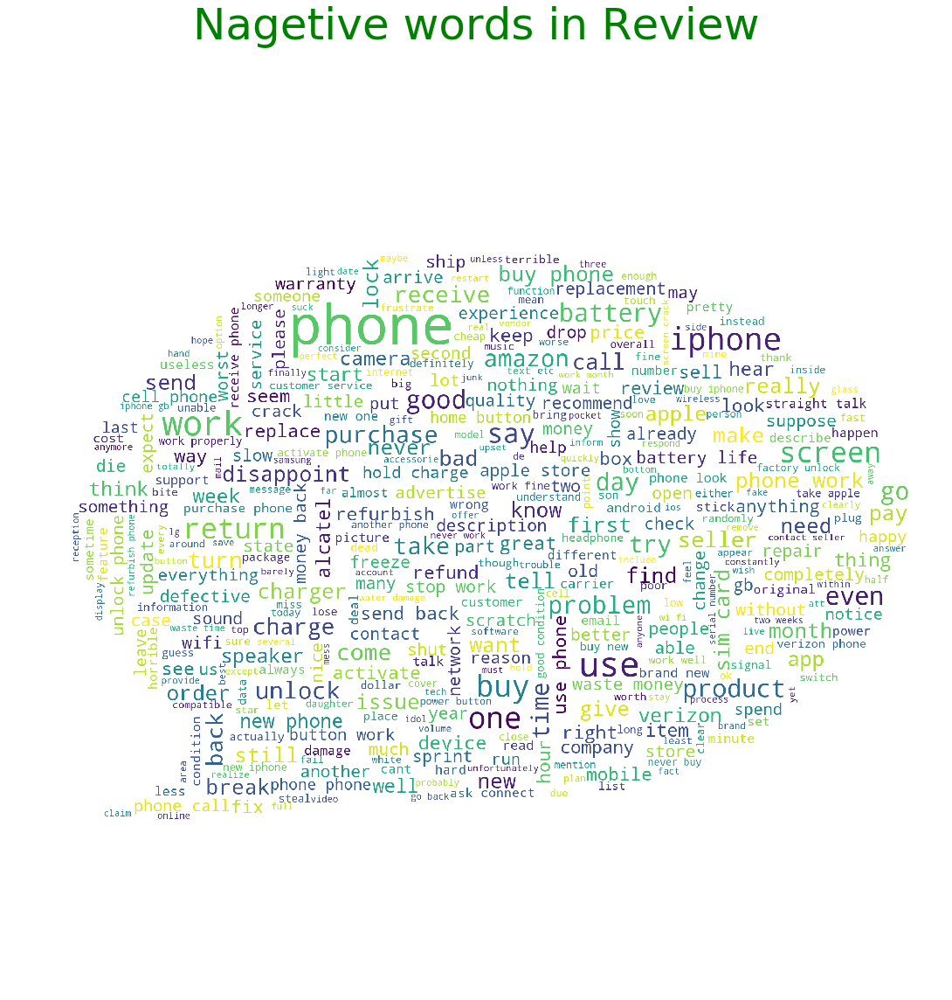

In [ ]:
comments_text = str(nagetive_list_bow)
comments_mask = np.array(Image.open(way + 'comment.png'))
plot_wordcloud(comments_text, comments_mask, max_words=400, max_font_size=120, 
               title = 'Nagetive words in Review', title_size=50)

# TF_IDF

##### We will use tfidf transformation with ngrams between 1 and 4.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer( min_df=2, max_df=0.95, max_features = 50000, ngram_range = ( 2, 2 ))

tfidf = tfidf.fit(new_data['clean_review'])
x = tfidf.transform(new_data['clean_review'])

In [ ]:
x

<30000x50000 sparse matrix of type '<class 'numpy.float64'>'
	with 354990 stored elements in Compressed Sparse Row format>

In [ ]:
print(x)

  (0, 23996)	0.2301801773756228
  (0, 23484)	0.24825916043423152
  (0, 23258)	0.24478735082836917
  (0, 19656)	0.22496665150620776
  (0, 19596)	0.23656101734774143
  (0, 19076)	0.1969196187034186
  (0, 18195)	0.1830364136568445
  (0, 17876)	0.21674031802558003
  (0, 16252)	0.23656101734774143
  (0, 16073)	0.21674031802558003
  (0, 15888)	0.2301801773756228
  (0, 14681)	0.22496665150620776
  (0, 14577)	0.24478735082836917
  (0, 14488)	0.2133722856646741
  (0, 14239)	0.16735004704823261
  (0, 11558)	0.2301801773756228
  (0, 9445)	0.22496665150620776
  (0, 7503)	0.2133722856646741
  (0, 7363)	0.22496665150620776
  (0, 7340)	0.24478735082836917
  (1, 20517)	0.27966627716979703
  (1, 19835)	0.3476482818481029
  (1, 19829)	0.3476482818481029
  (1, 19030)	0.3476482818481029
  (1, 16107)	0.3132385936627912
  :	:
  (5756, 17693)	0.45923254878314296
  (5756, 16828)	0.4752022133280644
  (5756, 9107)	0.27731331549545396
  (5756, 2449)	0.23989306689189677
  (5756, 1315)	0.3645994180683131
  (5756, 

In [ ]:
feature_names = tfidf.get_feature_names()

doc = 0
feature_index = x[doc,:].nonzero()[1]
tfidf_scores = zip(feature_index, [x[doc, a] for a in feature_index])

In [ ]:
 x[doc,:].nonzero()[1]

array([23996, 23484, 23258, 19656, 19596, 19076, 18195, 17876, 16252,
       16073, 15888, 14681, 14577, 14488, 14239, 11558,  9445,  7503,
        7363,  7340], dtype=int32)

In [ ]:
df = pd.DataFrame(x.toarray(), columns = tfidf.get_feature_names())
print(df)

      aaa thank  abble suggest  ...  zone stick  zte zmax
0           0.0            0.0  ...         0.0       0.0
1           0.0            0.0  ...         0.0       0.0
2           0.0            0.0  ...         0.0       0.0
3           0.0            0.0  ...         0.0       0.0
4           0.0            0.0  ...         0.0       0.0
...         ...            ...  ...         ...       ...
5756        0.0            0.0  ...         0.0       0.0
5757        0.0            0.0  ...         0.0       0.0
5758        0.0            0.0  ...         0.0       0.0
5759        0.0            0.0  ...         0.0       0.0
5760        0.0            0.0  ...         0.0       0.0

[5761 rows x 25152 columns]


In [ ]:
for w, s in [(feature_names[i], s) for (i, s) in tfidf_scores]:
    print(w, s)

want upgrade 0.2301801773756228
use phone 0.24825916043423152
us not 0.24478735082836917
seller really 0.22496665150620776
sell one 0.23656101734774143
say use 0.1969196187034186
recommend seller 0.1830364136568445
really appreciate 0.21674031802558003
phone us 0.23656101734774143
phone recommend 0.21674031802558003
phone line 0.2301801773756228
one son 0.22496665150620776
one finally 0.24478735082836917
old one 0.2133722856646741
not use 0.16735004704823261
like old 0.2301801773756228
hard phone 0.22496665150620776
find use 0.2133722856646741
fell apart 0.22496665150620776
feel lucky 0.24478735082836917


In [ ]:
y=new_data['sentiment'].values
y

array([1, 1, 1, ..., 1, 0, 0])

### Splitting Data

In [ ]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(4608, 25152) (4608,)
(1153, 25152) (1153,)


### SVC Classifier using TFIDF

In [ ]:
from sklearn import svm
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [ ]:
%%time
tf_svc_cls = svm.SVC(kernel='linear')
tf_svc_cls.fit(X_train, y_train)
tf_svc_prediction = tf_svc_cls.predict(X_test)

CPU times: user 2.32 s, sys: 28.9 ms, total: 2.35 s
Wall time: 2.36 s


In [ ]:
print("Confusion Matrix is : \n\n" , confusion_matrix(y_test,tf_svc_prediction))
print("\n")
print("Classification Report for SVC :  \n\n" ,classification_report(y_test,tf_svc_prediction))
print("\n Accuracy Score for SVC :  ",accuracy_score(y_test,tf_svc_prediction))

Confusion Matrix is : 

 [[239  78]
 [ 13 823]]


Classification Report for SVC :  

               precision    recall  f1-score   support

           0       0.95      0.75      0.84       317
           1       0.91      0.98      0.95       836

    accuracy                           0.92      1153
   macro avg       0.93      0.87      0.89      1153
weighted avg       0.92      0.92      0.92      1153


 Accuracy Score for SVC :   0.9210754553339116


In [ ]:
cm=confusion_matrix(y_test,tf_svc_prediction)

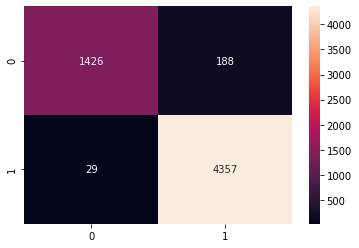

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True,fmt='d')

In [ ]:
#import scikitplot as skplt

#skplt.metrics.plot_confusion_matrix(y_test,tf_svc_prediction,figsize=(12,12))

In [ ]:
#data = confusion_matrix(y_test,tf_svc_prediction)
#df_cm = pd.DataFrame(data, columns=np.unique(y_test), index = np.unique(y_test))
#df_cm.index.name = 'Actual'
#df_cm.columns.name = 'Predicted'
#plt.figure(figsize = (10,7))
#sns.set(font_scale=1.4)#for label size
#sns.heatmap(df_cm, cmap="Blues", annot=True,annot_kws={"size": 16})

In [ ]:
tf_svc = accuracy_score(y_test,tf_svc_prediction)
tf_svc

0.9210754553339116

Text(0.5, 1.0, 'Actual Vs SVC Classifier Prediction')

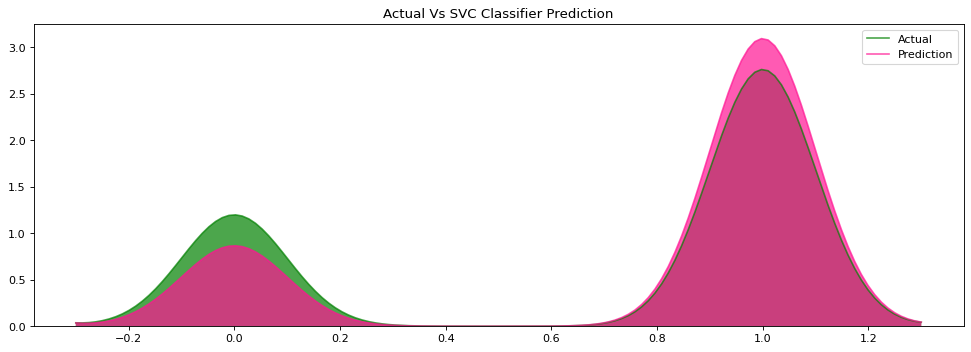

In [ ]:
plt.figure(figsize=(15,5), dpi= 80)
sns.kdeplot(new_data['sentiment'],bw=.1,shade=True, color="g", label="Actual", alpha=0.7)
sns.kdeplot(tf_svc_prediction, shade=True,bw=.1, color="deeppink", label="Prediction", alpha=0.7)
plt.title("Actual Vs SVC Classifier Prediction")

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test,tf_svc_prediction)

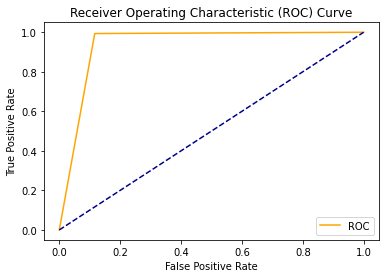

 0.94


In [ ]:
plot_roc_curve(fpr, tpr)
auc = roc_auc_score(y_test,tf_svc_prediction)
print(' %.2f' % auc)

# Naive Bayes Classifier using TFIDF

In [ ]:
%%time
from sklearn.naive_bayes import MultinomialNB
tf_model_nb=MultinomialNB()
tf_model_nb.fit(X_train,y_train)
tf_nb_pred=tf_model_nb.predict(X_test)

CPU times: user 7.92 ms, sys: 0 ns, total: 7.92 ms
Wall time: 9.71 ms


In [ ]:
print("Confusion Matrix is : \n\n" , confusion_matrix(y_test,tf_nb_pred))
print("\n")
print("Classification Report for Naive Bayes :  \n\n" ,classification_report(y_test,tf_nb_pred))
print("\n Accuracy Score for Naive Bayes :  ",accuracy_score(y_test,tf_nb_pred))

Confusion Matrix is : 

 [[214 103]
 [  4 832]]


Classification Report for Naive Bayes :  

               precision    recall  f1-score   support

           0       0.98      0.68      0.80       317
           1       0.89      1.00      0.94       836

    accuracy                           0.91      1153
   macro avg       0.94      0.84      0.87      1153
weighted avg       0.92      0.91      0.90      1153


 Accuracy Score for Naive Bayes :   0.9071986123156982


In [ ]:
tf_nb = accuracy_score(y_test,tf_nb_pred)
tf_nb

0.958

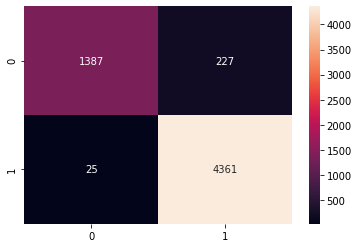

In [ ]:
cm=confusion_matrix(y_test,tf_nb_pred)
import seaborn as sns
sns.heatmap(cm, annot=True,fmt='d')

Text(0.5, 1.0, 'Actual Vs Naive Bayes Classifier Prediction')

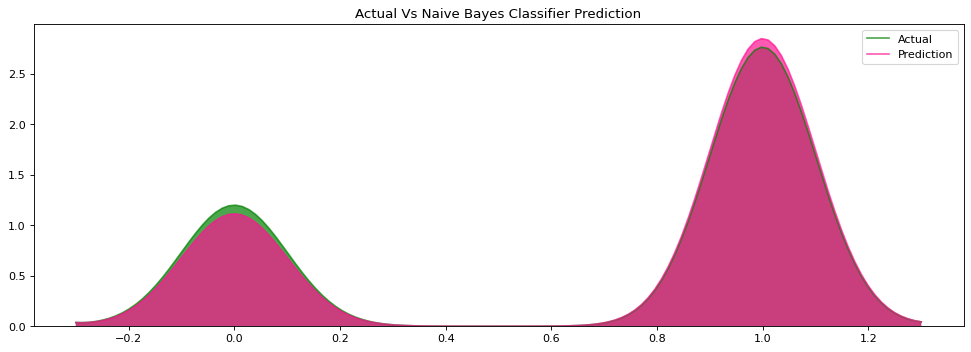

In [ ]:
plt.figure(figsize=(15,5), dpi= 80)
sns.kdeplot(new_data['sentiment'],bw=.1,shade=True, color="g", label="Actual", alpha=.7)
sns.kdeplot(tf_nb_pred, shade=True,bw=.1, color="deeppink", label="Prediction", alpha=.7)
plt.title("Actual Vs Naive Bayes Classifier Prediction")

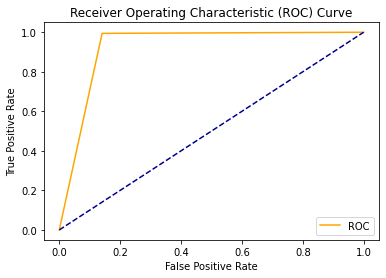

 0.93


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
fpr, tpr, thresholds = roc_curve(y_test,tf_nb_pred)
plot_roc_curve(fpr, tpr)
auc = roc_auc_score(y_test,tf_nb_pred)
print(' %.2f' % auc)

# CountVectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
cv = CountVectorizer(max_features=10000)
cv_train_features = cv.fit_transform(new_data['clean_review'])
x1 = cv_train_features

In [ ]:
print(cv.vocabulary_)

{'feel': 2062, 'lucky': 3335, 'find': 2093, 'use': 6037, 'phone': 4124, 'us': 6026, 'not': 3781, 'hard': 2533, 'line': 3238, 'someone': 5229, 'upgrade': 6012, 'sell': 4952, 'one': 3870, 'son': 5237, 'like': 3230, 'old': 3862, 'finally': 2090, 'fell': 2065, 'apart': 286, 'years': 6359, 'want': 6177, 'thank': 5644, 'seller': 4954, 'really': 4526, 'appreciate': 313, 'honesty': 2645, 'say': 4870, 'recommend': 4573, 'highly': 2609, 'would': 6330, 'nice': 3736, 'grade': 2421, 'pantach': 4006, 'revue': 4767, 'clean': 998, 'set': 4988, 'easy': 1739, 'never': 3720, 'android': 240, 'fantastic': 2025, 'least': 3172, 'perfect': 4080, 'size': 5118, 'surf': 5499, 'social': 5211, 'media': 3437, 'great': 2455, 'samsung': 4852, 'please': 4189, 'work': 6308, 'good': 2391, 'go': 2378, 'slow': 5159, 'sometimes': 5233, 'love': 3320, 'replace': 4680, 'lose': 3309, 'thing': 5675, 'volume': 6146, 'button': 787, 'still': 5389, 'settings': 4990, 'adjust': 104, 'job': 3033, 'eligible': 1781, 'thaanks': 5642, 'al

In [ ]:
m=cv.transform(new_data['clean_review']).toarray()
m

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [ ]:
y1=new_data['sentiment'].values

In [ ]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=0)

### SVC Classifier using CountVectorizer

In [ ]:
%%time
scv_countv = svm.SVC(kernel='linear')
scv_countv.fit(X_train, y_train)
scv_countv_pred = scv_countv.predict(X_test)

CPU times: user 33 s, sys: 66.3 ms, total: 33 s
Wall time: 33 s


In [ ]:
print("Confusion Matrix is : \n\n" , confusion_matrix(y_test,scv_countv_pred))
print("\n")
print("Classification Report for SVC :  \n\n" ,classification_report(y_test,scv_countv_pred))
print("\n Accuracy Score for SVC :  ",accuracy_score(y_test,scv_countv_pred))

Confusion Matrix is : 

 [[1514  100]
 [  75 4311]]


Classification Report for SVC :  

               precision    recall  f1-score   support

           0       0.95      0.94      0.95      1614
           1       0.98      0.98      0.98      4386

    accuracy                           0.97      6000
   macro avg       0.97      0.96      0.96      6000
weighted avg       0.97      0.97      0.97      6000


 Accuracy Score for SVC :   0.9708333333333333


In [ ]:
count_svc = accuracy_score(y_test,scv_countv_pred)
count_svc

0.9708333333333333

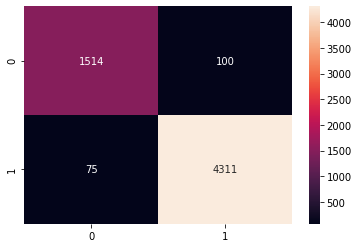

In [ ]:
cm=confusion_matrix(y_test,scv_countv_pred)
import seaborn as sns
sns.heatmap(cm, annot=True,fmt='d')

Text(0.5, 1.0, 'Actual Vs SVC Classifier Prediction')

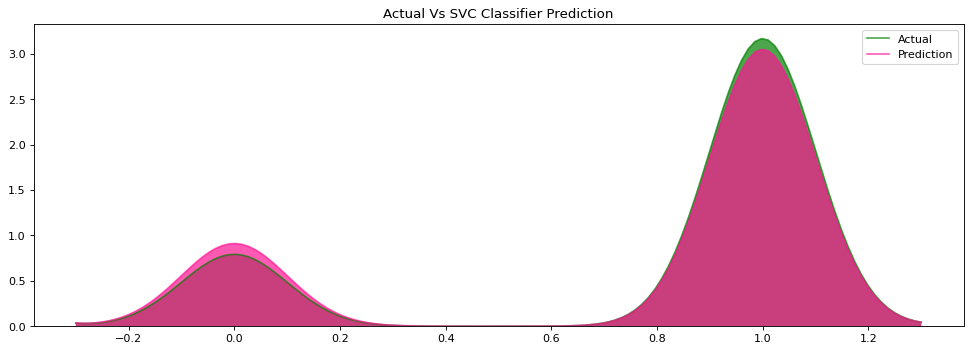

In [ ]:
plt.figure(figsize=(15,5), dpi= 80)
sns.kdeplot(new_data['sentiment'][:100],bw=.1,shade=True, color="green", label="Actual", alpha=.7)
sns.kdeplot(scv_countv_pred[:100], shade=True,bw=.1, color="deeppink", label="Prediction", alpha=.7)
plt.title("Actual Vs SVC Classifier Prediction")

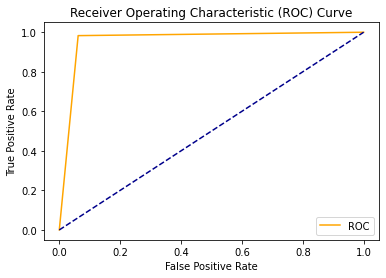

 0.96


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
fpr, tpr, thresholds = roc_curve(y_test,scv_countv_pred)
plot_roc_curve(fpr, tpr)
auc = roc_auc_score(y_test,scv_countv_pred)
print(' %.2f' % auc)

### Naive Bayes using CountVectorizer

In [ ]:
%%time
from sklearn.naive_bayes import MultinomialNB
count_model_nb=MultinomialNB()
count_model_nb.fit(X_train,y_train)
count_nb_pred=count_model_nb.predict(X_test)

CPU times: user 13.3 ms, sys: 0 ns, total: 13.3 ms
Wall time: 17.8 ms


In [ ]:
print("Confusion Matrix is : \n\n" , confusion_matrix(y_test,count_nb_pred))
print("\n")
print("Classification Report for Naive Bayes :  \n\n" ,classification_report(y_test,count_nb_pred))
print("\n Accuracy Score for Naive Bayes :  ",accuracy_score(y_test,count_nb_pred))

Confusion Matrix is : 

 [[1396  218]
 [ 137 4249]]


Classification Report for Naive Bayes :  

               precision    recall  f1-score   support

           0       0.91      0.86      0.89      1614
           1       0.95      0.97      0.96      4386

    accuracy                           0.94      6000
   macro avg       0.93      0.92      0.92      6000
weighted avg       0.94      0.94      0.94      6000


 Accuracy Score for Naive Bayes :   0.9408333333333333


In [ ]:
count_nb = accuracy_score(y_test,count_nb_pred)
count_nb

0.9408333333333333

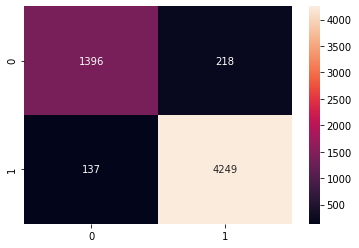

In [ ]:
cm=confusion_matrix(y_test,count_nb_pred)
import seaborn as sns
sns.heatmap(cm, annot=True,fmt='d')

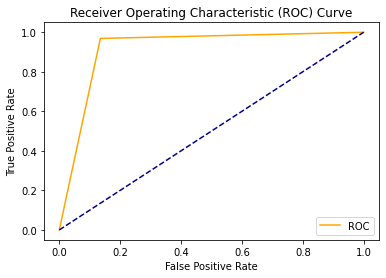

 0.92


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
fpr, tpr, thresholds = roc_curve(y_test,count_nb_pred)
plot_roc_curve(fpr, tpr)
auc = roc_auc_score(y_test,count_nb_pred)
print(' %.2f' % auc)

Text(0.5, 1.0, 'Actual Vs Naive Bayes Classifier Prediction')

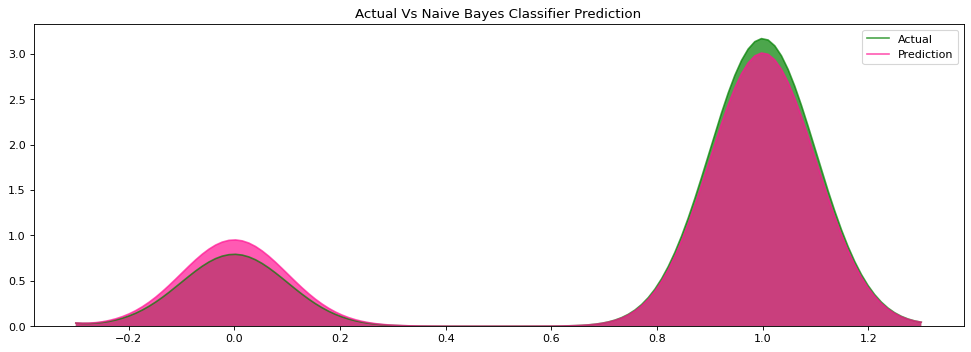

In [ ]:
plt.figure(figsize=(15,5), dpi= 80)
sns.kdeplot(new_data['sentiment'][:100],bw=.1,shade=True, color="green", label="Actual", alpha=.7)
sns.kdeplot(count_nb_pred[:100], shade=True,bw=.1, color="deeppink", label="Prediction", alpha=.7)
plt.title("Actual Vs Naive Bayes Classifier Prediction")

# Comparison Of Models

In [ ]:
tfidf_acc=[tf_svc,tf_nb]
count_acc=[count_svc,count_nb]

models=['Support vector Classifier','Naive Bayes Classifier']
col={'Model_nm':models,'Using tfidf Accuracy':tfidf_acc,'Using CountVectorizer Accuracy':count_acc}
df=pd.DataFrame(data=col)
df

,Model_nm,Using tfidf Accuracy,Using CountVectorizer Accuracy
0,Support vector Classifier,0.963833,0.970833
1,Naive Bayes Classifier,0.958000,0.940833


In [ ]:
# !pip install joypy
# Import Data
#mpg = pd.read_csv("https://github.com/selva86/datasets/raw/master/mpg_ggplot2.csv")
#import joypy
#%matplotlib inline
#fig, axes = joypy.joyplot(df, by="Model_nm")


In [ ]:
#sns.catplot(x="Model_nm", y="Using tfidf Accuracy", data=df);

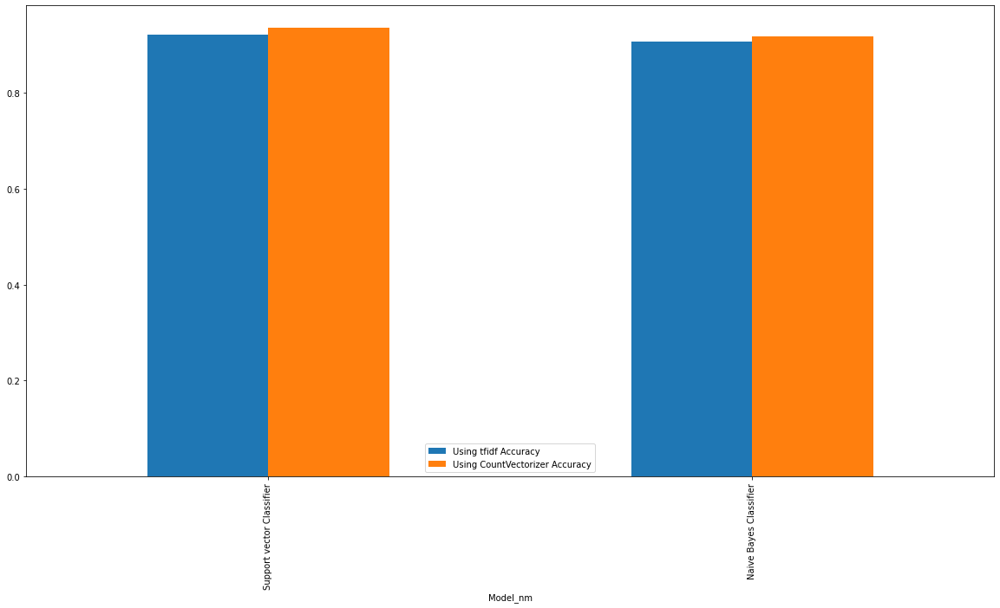

In [ ]:
fig,ax=plt.subplots(figsize=(20,10))
df.plot(x="Model_nm", y=["Using tfidf Accuracy", "Using CountVectorizer Accuracy"],kind="bar",ax=ax)


word Tokenization

In [ ]:

from nltk.tokenize import word_tokenize

In [ ]:
def clean(review_column):
    review_corpus=[]
    for i in range(0,len(review_column)):
        review=review_column[i]
        
        
        #word_tokenize
        review=word_tokenize(review)
        
        
        review_corpus.append(review)
        
    return review_corpus
        

In [ ]:
review_column=new_data['clean_review']
review_corpus2=clean(review_column)

In [ ]:
review_corpus2

[['feel',
  'lucky',
  'find',
  'use',
  'phone',
  'us',
  'not',
  'use',
  'hard',
  'phone',
  'line',
  'someone',
  'upgrade',
  'sell',
  'one',
  'son',
  'like',
  'old',
  'one',
  'finally',
  'fell',
  'apart',
  'years',
  'want',
  'upgrade',
  'thank',
  'seller',
  'really',
  'appreciate',
  'honesty',
  'say',
  'use',
  'phone',
  'recommend',
  'seller',
  'highly',
  'would'],
 ['nice',
  'phone',
  'nice',
  'grade',
  'pantach',
  'revue',
  'clean',
  'set',
  'easy',
  'set',
  'never',
  'android',
  'phone',
  'fantastic',
  'say',
  'least',
  'perfect',
  'size',
  'surf',
  'social',
  'media',
  'great',
  'phone',
  'samsung'],
 ['please'],
 ['work', 'good', 'go', 'slow', 'sometimes', 'good', 'phone', 'love'],
 ['great',
  'phone',
  'replace',
  'lose',
  'phone',
  'thing',
  'volume',
  'button',
  'not',
  'work',
  'still',
  'go',
  'settings',
  'adjust',
  'job',
  'eligible',
  'upgrade',
  'phone',
  'thaanks'],
 ['already',
  'phone',
  'prob

#### Word2Vec for CBOW

In [ ]:
import gensim

# size : embed dimension
# min_count : filter words without min frequency
# sg : 0 for CBOW; 1 for skip-gram
# negative : how many noise words should be drawn
%time model_w2v = gensim.models.Word2Vec(review_corpus2, size=64, min_count=5, sg=0, negative=5, workers=2)

Wall time: 3.23 s


In [ ]:
len(model_w2v.wv.vocab) 

2643

In [ ]:
display(model_w2v.wv.most_similar('awesome'))

[('amaze', 0.9894545078277588),
 ('excellent', 0.9876217246055603),
 ('shape', 0.9828471541404724),
 ('cosmetic', 0.9827019572257996),
 ('expect', 0.9812172651290894),
 ('overall', 0.9806084632873535),
 ('far', 0.9782729744911194),
 ('mint', 0.9735596776008606),
 ('really', 0.9719322919845581),
 ('earlier', 0.9693959951400757)]

#### Word2Vec for skip-gram

In [ ]:
# size : embed dimension
# min_count : filter words without min frequency
# sg : 0 for CBOW; 1 for skip-gram
# negative : how many noise words should be drawn
%time model_w2v = gensim.models.Word2Vec(review_corpus2, size=64, min_count=5, sg=1, negative=5, workers=2)

Wall time: 2.64 s


In [ ]:
review_corpus2

[['feel',
  'lucky',
  'find',
  'use',
  'phone',
  'us',
  'not',
  'use',
  'hard',
  'phone',
  'line',
  'someone',
  'upgrade',
  'sell',
  'one',
  'son',
  'like',
  'old',
  'one',
  'finally',
  'fell',
  'apart',
  'years',
  'want',
  'upgrade',
  'thank',
  'seller',
  'really',
  'appreciate',
  'honesty',
  'say',
  'use',
  'phone',
  'recommend',
  'seller',
  'highly',
  'would'],
 ['nice',
  'phone',
  'nice',
  'grade',
  'pantach',
  'revue',
  'clean',
  'set',
  'easy',
  'set',
  'never',
  'android',
  'phone',
  'fantastic',
  'say',
  'least',
  'perfect',
  'size',
  'surf',
  'social',
  'media',
  'great',
  'phone',
  'samsung'],
 ['please'],
 ['work', 'good', 'go', 'slow', 'sometimes', 'good', 'phone', 'love'],
 ['great',
  'phone',
  'replace',
  'lose',
  'phone',
  'thing',
  'volume',
  'button',
  'not',
  'work',
  'still',
  'go',
  'settings',
  'adjust',
  'job',
  'eligible',
  'upgrade',
  'phone',
  'thaanks'],
 ['already',
  'phone',
  'prob

In [ ]:

display(model_w2v.wv.most_similar('awesome'))

[('amaze', 0.8991641998291016),
 ('impress', 0.877842903137207),
 ('wonderful', 0.869157075881958),
 ('appreciate', 0.8628646731376648),
 ('great', 0.8522061705589294),
 ('forward', 0.8493836522102356),
 ('speedy', 0.8458189368247986),
 ('fantastic', 0.8454596400260925),
 ('earlier', 0.8434094190597534),
 ('expectation', 0.8428425788879395)]

# FastText with Similar words

In [ ]:
%%time
from gensim.models.fasttext import FastText

wpt = nltk.WordPunctTokenizer()
#tokenized_corpus = [wpt.tokenize(document) for document in review_corpus]

# Set values for various parameters
feature_size = 100    # Word vector dimensionality  
window_context = 50          # Context window size                                                                                    
min_word_count = 5   # Minimum word count                        
sample = 1e-3   # Downsample setting for frequent words


ft_model = FastText(review_corpus2, size=feature_size, window=window_context, 
                    min_count=min_word_count,sample=sample, sg=1, iter=50)

NameError: ignored

In [ ]:
print(ft_model)

FastText(vocab=2643, size=100, alpha=0.025)


In [ ]:
print(ft_model.wv['good'])

[-0.25606295  0.07362317  0.00618938  0.02303849 -0.01257222 -0.11543378
 -0.28686893 -0.131816   -0.05039317  0.05530602 -0.16898185  0.04391828
 -0.04864422  0.03047834 -0.00933738  0.01719835  0.02951598  0.06882997
 -0.10899936  0.18856296  0.03768605  0.19700338 -0.17158183  0.12631047
  0.01654094  0.22837047 -0.18158874 -0.28478864 -0.14314285  0.07285079
 -0.14632976  0.01814346  0.04063517 -0.06758706  0.04794713 -0.18342876
 -0.1459991   0.1795149   0.11306842 -0.02289977  0.03872594  0.0163898
  0.01395165 -0.04867048  0.0368001   0.16573457  0.16318552 -0.02351446
 -0.06133563  0.03909729  0.03087711  0.19092172 -0.01755043 -0.00113583
  0.28010076 -0.01050044  0.00667539 -0.29923138 -0.04215119  0.02711864
  0.1881136  -0.09196532  0.09871752 -0.05322834  0.07987214  0.0233295
  0.23445788 -0.02722578 -0.05298021  0.03449355 -0.02562811 -0.05648032
 -0.00296842 -0.03916742  0.23529094 -0.04803261  0.03969746 -0.02467264
  0.0235528  -0.23816647  0.11025669  0.1017811   0.2

In [ ]:
#view similar words based on gensim's model
similar_words = {search_term: [item[0] for item in ft_model.wv.most_similar([search_term], topn=6)]
                  for search_term in ['feel', 'bad', 'worst', 'awesome', 'good', 'hard','damage']}
similar_words

{'feel': ['solid', 'nice', 'hand', 'build', 'much', 'smooth'],
 'bad': ['not', 'could', 'phone', 'return', 'second', 'back'],
 'worst': ['ever', 'even', 'never', 'buy', 'crack', 'girlfriend'],
 'awesome': ['great', 'definitely', 'good', 'price', 'love', 'excellent'],
 'good': ['great', 'price', 'condition', 'excellent', 'like', 'quality'],
 'hard': ['cover', 'press', 'protect', 'mths', 'think', 'screen'],
 'damage': ['water', 'producto', 'internally', 'hotmail', 'expose', 'rice']}

In [ ]:
print(ft_model.wv.similarity(w1="good",w2="bad"))

0.40028876


In [ ]:
print(ft_model.wv.similarity(w1="good",w2="best"))

0.4670602


# FastText with CNN

In [ ]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = ""

In [ ]:
import tensorflow as tf
import numpy as np
import random as rn

sd = 1 # Here sd means seed.
np.random.seed(sd)
rn.seed(sd)
os.environ['PYTHONHASHSEED']=str(sd)


from tensorflow.python.keras import backend as k
config = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1,inter_op_parallelism_threads=1)
tf.random.set_seed(sd)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=config)
#K.set_session(sess)
tf.compat.v1.keras.backend.set_session(tf.compat.v1.Session(config=config));


In [ ]:
%%time
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from gensim.models.fasttext import FastText
from keras.layers import Conv1D, MaxPooling1D, Embedding
from keras.layers import Dense, Input, GlobalMaxPooling1D , Dropout
from keras.models import Model
from keras.optimizers import Adam
from tensorflow.keras import models
from tensorflow.keras import layers
from sklearn.metrics import confusion_matrix

Using TensorFlow backend.


CPU times: user 1.37 s, sys: 140 ms, total: 1.51 s
Wall time: 1.81 s


In [ ]:
new_data = new_data[:5761]

In [ ]:
BASE_DIR = ''
MAX_SEQUENCE_LENGTH = 800
MAX_NUM_WORDS = 20000
EMBEDDING_DIM = 300


In [ ]:
new_data.shape

(5761, 8)

In [ ]:
new_data.head(5)

,Product Name,Brand Name,Price,Rating,Reviews,Review Votes,sentiment,clean_review
0,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,I feel so LUCKY to have found this used (phone...,1.0,1,feel lucky find use phone us not use hard phon...
1,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,"nice phone, nice up grade from my pantach revu...",0.0,1,nice phone nice grade pantach revue clean set ...
2,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,5,Very pleased,0.0,1,please
3,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,It works good but it goes slow sometimes but i...,0.0,1,work good go slow sometimes good phone love
4,"""CLEAR CLEAN ESN"" Sprint EPIC 4G Galaxy SPH-D7...",Samsung,199.99,4,Great phone to replace my lost phone. The only...,0.0,1,great phone replace lose phone thing volume bu...


In [ ]:
%%time
texts = new_data.clean_review.values
labels = new_data.sentiment.values


CPU times: user 403 µs, sys: 0 ns, total: 403 µs
Wall time: 408 µs


In [ ]:
texts = texts[:MAX_NUM_WORDS]
labels = labels[:MAX_NUM_WORDS]


In [ ]:
labels=np.array(list(labels))

In [ ]:
X_final=texts
y_final=labels

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test= train_test_split(X_final, y_final, test_size=0.2, random_state=0)

In [ ]:
# finally, vectorize the text samples into a 2D integer tensor
tokenizer = Tokenizer(num_words=MAX_NUM_WORDS)
tokenizer.fit_on_texts(X_train)
X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)
#sequences = tokenizer.texts_to_sequences(texts)

In [ ]:
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 5888 unique tokens.


In [ ]:
vocab_size = len(tokenizer.word_index) + 1



X_train = pad_sequences(X_train,maxlen=MAX_SEQUENCE_LENGTH)
X_test = pad_sequences(X_test,maxlen=MAX_SEQUENCE_LENGTH)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(4608, 800)
(4608,)
(1153, 800)
(1153,)


In [ ]:
%%time
f = FastText.load_fasttext_format('/content/gdrive/My Drive/data/wiki.simple.bin')

CPU times: user 13.3 s, sys: 2.18 s, total: 15.5 s
Wall time: 55.6 s


In [ ]:
print('Preparing embedding matrix.')
words_not_found = []
num_words = min(MAX_NUM_WORDS,vocab_size)
embedding_matrix = np.zeros((num_words, EMBEDDING_DIM))
for word, i in word_index.items():
    if i >= MAX_NUM_WORDS:
        continue
    embedding_vector = f.wv.get_vector(word)
    if embedding_vector is not None and len(embedding_vector) > 0:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector
    else:
     # print(word +'not in dic') 
     words_not_found.append(word)
print('number of null word embeddings: %d' % np.sum(np.sum(embedding_matrix, axis=1) == 0))   

Preparing embedding matrix.
number of null word embeddings: 1


In [ ]:
print("sample words not found: ",  np.random.choice(words_not_found))

sample words not found:  headbands


In [ ]:
for word, i in word_index.items():
  print( word, i)

Streaming output truncated to the last 5000 lines.
itunes 890
factor 891
durable 892
siri 893
sunlight 894
hopefully 895
produce 896
certainly 897
body 898
recomend 899
higher 900
act 901
crash 902
mini 903
english 904
niece 905
generation 906
icons 907
house 908
premium 909
tag 910
accept 911
laggy 912
removable 913
paper 914
surprisingly 915
unresponsive 916
prime 917
smoothly 918
slight 919
step 920
boot 921
venezuela 922
noticeable 923
snapdragon 924
mah 925
despite 926
lightweight 927
setup 928
comment 929
post 930
acceptable 931
microphone 932
nfc 933
bud 934
manage 935
late 936
microsd 937
larger 938
afford 939
originally 940
pink 941
sprint 942
hassle 943
sellers 944
lowest 945
outstanding 946
restore 947
sleep 948
website 949
shame 950
snappy 951
bother 952
motorola 953
powerful 954
per 955
push 956
areas 957
headphone 958
recieved 959
mb 960
map 961
notifications 962
windows 963
nicely 964
movies 965
bill 966
idea 967
necessary 968
till 969
select 970
chance 971
manufacturer 

In [ ]:
embedding_vector = f.wv.most_similar('headbands')
embedding_vector

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('headband', 0.9051349759101868),
 ('headbangers', 0.7229579091072083),
 ('armbands', 0.648292064666748),
 ('headbutt', 0.6391899585723877),
 ('headbutts', 0.6236999034881592),
 ('wristbands', 0.6032060980796814),
 ('broadband', 0.5715808868408203),
 ('headgear', 0.5659369230270386),
 ('wristband', 0.5637907981872559),
 ('armband', 0.5609850287437439)]

In [ ]:
embedding_vector = f.wv.get_vector('phone')
embedding_vector

array([-0.15660101, -0.29508075, -0.37039033, -0.18940426,  0.4431798 ,
        0.28964803, -0.32149693,  0.00202594,  0.11183712,  0.0825487 ,
        0.24475797,  0.09114243,  0.3133849 ,  0.37680066, -0.2829347 ,
       -0.66393954, -0.57062167, -0.03399692, -0.4937151 , -0.78928655,
       -0.0043101 ,  0.53720605, -0.19632217, -0.19808516,  0.21140712,
       -0.6724668 ,  0.3489572 , -0.4440859 , -0.11736462,  0.22237949,
       -0.4333638 ,  0.20277604, -0.27684635,  0.3445198 ,  0.03990253,
       -0.4096419 ,  0.05904504,  0.03432802, -0.22969273, -0.12348831,
        0.39471805, -0.17133449,  0.21186979,  0.01854935,  0.10468987,
        0.12901041, -0.00990334, -0.21152863,  0.47214377, -0.21064396,
        0.0940164 , -0.25780556, -0.23179436,  0.19873127, -0.33801964,
        0.34355646,  0.29000995,  0.10002483,  0.03786037, -0.39517328,
        0.11784554, -0.77530116, -0.16552319,  0.38504604,  0.02354815,
       -0.43056196, -0.33503768, -0.14474325, -0.09702897, -0.14

In [ ]:
embedding_vector = f.wv.get_vector('headbands')
embedding_vector

array([-3.37498561e-02,  2.98969708e-02, -1.48913652e-01, -6.49514869e-02,
        1.85291767e-01,  4.70326049e-03, -1.86519161e-01,  9.23207402e-02,
        9.31599811e-02, -3.49495560e-02,  1.46078721e-01, -7.59182125e-02,
        8.07150081e-02,  1.83545172e-01, -3.25586289e-01, -2.95394212e-01,
       -2.46797293e-01,  7.03916401e-02, -6.22535050e-02, -1.96694985e-01,
        3.20619822e-01,  3.53159785e-01, -6.83905244e-01,  9.80994254e-02,
       -7.23547786e-02, -1.92684188e-01, -1.18359998e-01, -3.53095144e-01,
        6.71131536e-02, -9.26467925e-02, -4.99406904e-02, -6.38490766e-02,
       -3.72110873e-01,  1.72780976e-01, -1.63399413e-01, -8.88714939e-02,
       -2.25893959e-01,  9.82895773e-03, -1.25711098e-01,  1.05528533e-01,
        1.19893506e-01,  7.62002319e-02,  3.86023194e-01, -3.63116086e-01,
        1.59355588e-02,  1.95955407e-04, -2.39313945e-01,  1.03793159e-01,
        4.40359004e-02,  2.98765898e-01,  1.92925766e-01, -4.85527702e-03,
        3.03592645e-02,  

In [ ]:
embedding_layer = Embedding(num_words,
                            EMBEDDING_DIM,
                            weights=[embedding_matrix],
                            input_length=MAX_SEQUENCE_LENGTH,
                            trainable=False)

In [ ]:
%%time
#A max pooling layer is often used after a CNN layer in order to reduce the complexity of the output
from keras.layers import Dense, Input, GlobalMaxPooling1D,Dropout

print('Training model.')

# train a 1D convnet with global maxpooling

sequence_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')
embedded_sequences = embedding_layer(sequence_input)
x = Conv1D(128, 5, activation='relu')(embedded_sequences)
x = MaxPooling1D(5)(x)
x = Conv1D(128, 5, activation='relu')(x)
x = MaxPooling1D(5)(x)
x = Conv1D(128, 5, activation='relu')(x)
x = GlobalMaxPooling1D()(x)
x = Dense(128, activation='relu')(x)
x= Dropout(0.5)(x)
preds = Dense(1, activation='sigmoid')(x)
model = Model(sequence_input, preds)
model.compile(loss='binary_crossentropy',
              optimizer='Adam',
              metrics=['acc'])


Training model.
CPU times: user 515 ms, sys: 222 ms, total: 737 ms
Wall time: 7.38 s


In [ ]:
history_3 =model.fit(X_train, y_train,
          batch_size=256,
          shuffle=True,
          epochs=10,
          validation_data=(X_test,y_test))

Train on 4608 samples, validate on 1153 samples
Epoch 1/10
4608/4608 [==============================] - 9s 2ms/step - loss: 0.6286 - acc: 0.6788 - val_loss: 0.5262 - val_acc: 0.7259
Epoch 2/10
4608/4608 [==============================] - 2s 516us/step - loss: 0.4552 - acc: 0.7854 - val_loss: 0.4023 - val_acc: 0.8352
Epoch 3/10
4608/4608 [==============================] - 2s 519us/step - loss: 0.3309 - acc: 0.8746 - val_loss: 0.2818 - val_acc: 0.8873
Epoch 4/10
4608/4608 [==============================] - 2s 520us/step - loss: 0.2473 - acc: 0.9115 - val_loss: 0.3644 - val_acc: 0.8638
Epoch 5/10
4608/4608 [==============================] - 2s 517us/step - loss: 0.1944 - acc: 0.9325 - val_loss: 0.2308 - val_acc: 0.9141
Epoch 6/10
4608/4608 [==============================] - 2s 515us/step - loss: 0.1298 - acc: 0.9586 - val_loss: 0.1934 - val_acc: 0.9297
Epoch 7/10
4608/4608 [==============================] - 2s 520us/step - loss: 0.0826 - acc: 0.9748 - val_loss: 0.1865 - val_acc: 0.9454
Ep

In [ ]:
loss, accuracy = model.evaluate(X_train, y_train, verbose=True)
print("Training Accuracy: {:.4f}".format(accuracy))
print("Training Loss: {:.4f}".format(loss))

16000/16000 [==============================] - 6s 357us/step
Training Accuracy: 0.9901
Training Loss: 0.0319


In [ ]:
loss, accuracy = model.evaluate(X_test,y_test,verbose=False)
print("Testing Accuracy:  {:.4f}".format(accuracy))
print("Testing Loss:  {:.4f}".format(loss))

Testing Accuracy:  0.9600
Testing Loss:  0.2534


In [ ]:
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [ ]:
def create_trace(x,y,ylabel,color):
        trace = go.Scatter(
            x = x,y = y,
            name=ylabel,
            marker=dict(color=color),
            mode = "markers+lines",
            text=x
        )
        return trace
    
def plot_accuracy_and_loss(history_3):
    hist = history_3.history
    acc = hist['acc']
   
    val_acc = hist['val_acc']
   
    loss = hist['loss']
    
    val_loss = hist['val_loss']
   
    epochs = list(range(1,len(acc)+1))
    
    trace_ta = create_trace(epochs,acc,"Training accuracy", "Green")
    trace_va = create_trace(epochs,val_acc,"Validation accuracy", "Red")
    trace_tl = create_trace(epochs,loss,"Training loss", "Blue")
    trace_vl = create_trace(epochs,val_loss,"Validation loss", "Magenta")
   
    fig = tools.make_subplots(rows=1,cols=2, subplot_titles=('Training and validation accuracy',
                                                             'Training and validation loss'))
    fig.append_trace(trace_ta,1,1)
    fig.append_trace(trace_va,1,1)
    fig.append_trace(trace_tl,1,2)
    fig.append_trace(trace_vl,1,2)
    fig['layout']['xaxis'].update(title = 'Epoch')
    fig['layout']['xaxis2'].update(title = 'Epoch')
    fig['layout']['yaxis'].update(title = 'Accuracy', range=[0,1])
    fig['layout']['yaxis2'].update(title = 'Loss', range=[0,1])

    
    iplot(fig, filename='accuracy-loss')

plot_accuracy_and_loss(history_3)

/usr/local/lib/python3.6/dist-packages/plotly/tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [ ]:
scores = model.evaluate(X_test,y_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

1153/1153 [==============================] - 1s 524us/step

acc: 94.19%


In [ ]:
y_pred = model.predict(X_test)
y_pred

array([[0.99945647],
       [1.        ],
       [0.0300321 ],
       ...,
       [1.        ],
       [0.01145285],
       [0.9999981 ]], dtype=float32)

In [ ]:
y_val.shape

NameError: ignored

In [ ]:
y_pred = np.round(y_pred)
y_pred

array([[1.],
       [1.],
       [0.],
       ...,
       [1.],
       [0.],
       [1.]], dtype=float32)

In [ ]:
conf_mat=  confusion_matrix(y_test,y_pred)
conf_mat

array([[283,  34],
       [ 33, 803]])

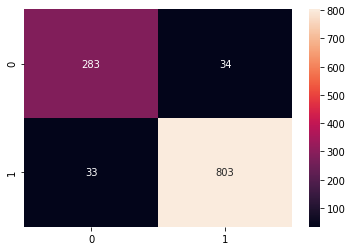

In [ ]:
cm=confusion_matrix(y_test,y_pred)
import seaborn as sns
sns.heatmap(cm, annot=True,fmt='d')

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.90      0.89      0.89       317
           1       0.96      0.96      0.96       836

    accuracy                           0.94      1153
   macro avg       0.93      0.93      0.93      1153
weighted avg       0.94      0.94      0.94      1153



ValueError: ignored

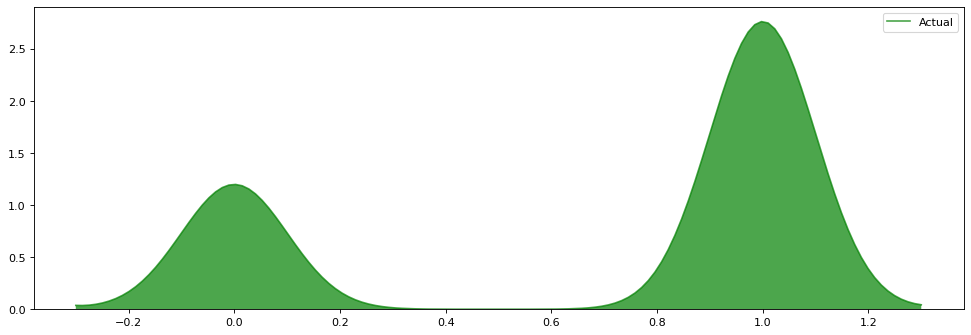

In [ ]:
plt.figure(figsize=(15,5), dpi= 80)
sns.kdeplot(new_data['sentiment'],bw=.1,shade=True, color="g", label="Actual", alpha=.7)
sns.kdeplot(y_pred, shade=True,bw=.1, color="deeppink", label="Prediction", alpha=.7)
plt.title("Actual Vs CNN Classifier Prediction")

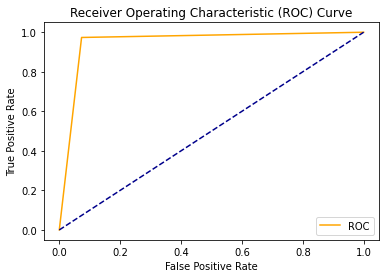

 0.95


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
fpr, tpr, thresholds = roc_curve(y_test,y_pred)
plot_roc_curve(fpr, tpr)
auc = roc_auc_score(y_test,y_pred)
print(' %.2f' % auc)

In [ ]:
print(model.summary())

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 800)               0         
_________________________________________________________________
embedding_3 (Embedding)      (None, 800, 300)          1766700   
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 796, 128)          192128    
_________________________________________________________________
max_pooling1d_5 (MaxPooling1 (None, 159, 128)          0         
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 155, 128)          82048     
_________________________________________________________________
max_pooling1d_6 (MaxPooling1 (None, 31, 128)           0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 27, 128)           8204

In [ ]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model

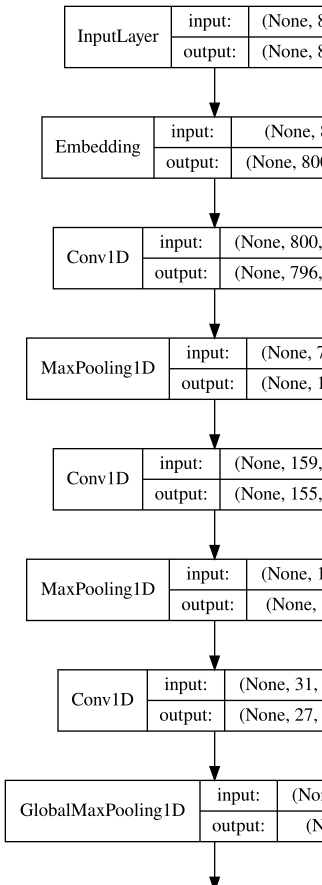

In [ ]:
import keras
import IPython
from IPython.display import SVG

from keras.utils.vis_utils import model_to_dot
def plot_keras_model(model, show_shapes=True,        show_layer_names=True):
    return SVG(model_to_dot(model, show_shapes=show_shapes,         show_layer_names=show_layer_names).create(prog='dot',format='svg'))
plot_keras_model(model, show_shapes=True, show_layer_names=False)

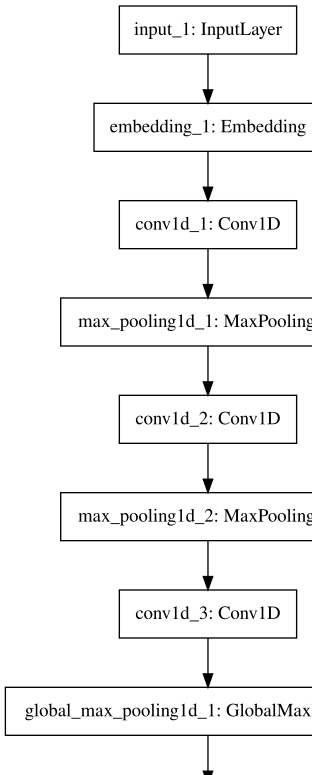

In [ ]:
plot_model(model, to_file='model.png')
SVG(model_to_dot(model).create(prog='dot', format='svg'))

In [ ]:
# https://github.com/mmortazavi/EntityEmbedding-Working_Example/blob/master/EntityEmbedding.ipynb
from keras.utils import plot_model
import pydot_ng as pydot

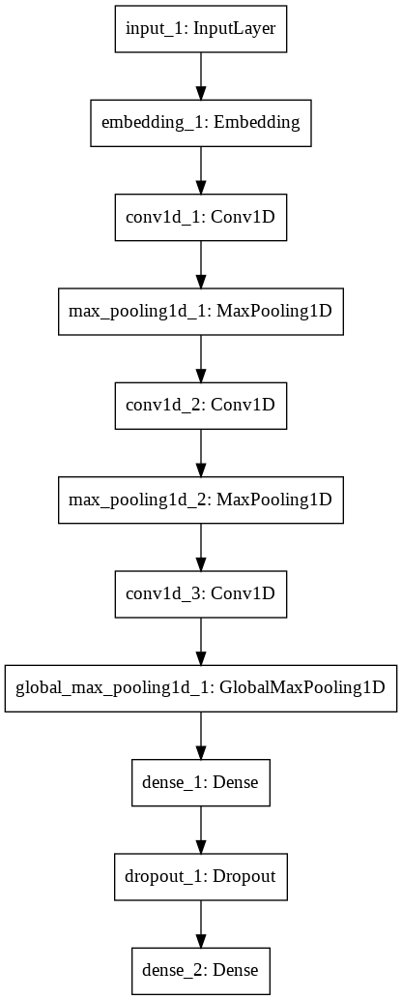

In [ ]:
plot_model(model, show_shapes=False, show_layer_names=True, to_file='model.png')
from IPython.display import Image
Image(retina=True, filename='model.png')